In [1]:
import numpy as np
import pandas as pd
import os
import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns

# Data reading

I need to read both the **HR** and the **Sales** sheets from the given file.

In [2]:
xl = 'Kalinax challenge 3_final_v1.xlsx'

Read them in separately

In [3]:
hr = pd.read_excel(xl, sheet_name='HR')
sales = pd.read_excel(xl, sheet_name='Sales')

In [4]:
hr.columns = hr.columns.str.lower().str.replace(' ', '_')
sales.columns = sales.columns.str.lower().str.replace(' ', '_')

Since it's likely most of the columns are useless for the problem at hand, I build a simple report for every dataset to briefly inspect all the variables

In [5]:
hr.profile_report(style={'full_width': True})

In [6]:
sales.profile_report(style={'full_width': True})

At this point I can join the 2 datasets together, below there are comments for every step:

In [81]:
df = (hr
      .set_index(['salessystemcode', 'month']) # the join keys
      .drop(['area', 'report_month', 'region_structure'], axis=1) # duplicate columns, drop them from one side
      .join(sales.rename(columns={'id_vendor': 'salessystemcode'}) # align names of one of the keys
            .set_index(['salessystemcode', 'month']))) # as the first step

By looking at the reports above I select a few useless columns to drop for various reasons:

- Comment: mostly empty and not interesting when present
- TRANSPORT: for the problem at hand we don't care whether an employee gets a transport allowance

And so on

In [82]:
to_drop = [
 'legal_motive',
 'name',
 'nationality',
 'transport',
 'accounting_type_desc.',
 'contact_name',
 'control',
 'cuenta',
 'customer',
 'desc._product',
 'disconnect_reason',
 'distribution_code',
 'inst_charge',
 'officer',
 'pending_reason',
 'phone_number',
 'service_number',
 'service_order',
 'status',
 'sub_family',
 'vendor',
 'supervisor_name',
 'status_code',
 'id_officer',
 'region_structure'
]

Then I actually drop the columns, reset the index (so that we get back **Month** and **SalesSystemCode** as columns) and finally I noticed that there are a few missing **SalesSystemCode** and we can't do anything without it, so I drop them

In [83]:
df = df.drop(axis=1, columns=to_drop)
df = df.reset_index()
df = df.dropna(subset=['salessystemcode'])

Convert **Month** to date and filter out supervisors: I saw that they usually don't make many direct sales and it's clear that their sales quota are tied to their employees quotas introducing a double counting issue

In [84]:
df['month'] = pd.to_datetime(df.month)
df = df[df.job_title != 'SALES SUPERVISOR']

In [85]:
df.span_of_control__supervisor.isna().sum() / df.shape[0]

0.24413150751844226

In [86]:
df['span'] = [1 if i > 15 else 0 for i in df.span_of_control__supervisor]

In [88]:
d = df.set_index('salessystemcode')

In [108]:
clean = []

for i in df.salessystemcode.unique():
    c = d.loc[[i]].reset_index()
    if c.shape[0] == 1 or c.span_of_control__supervisor.isnull().all():
        continue
    else:
        c['span_of_control__supervisor'] = c.span_of_control__supervisor.fillna(method='pad')
        if c.span_of_control__supervisor.isnull().values.any():
            c['span_of_control__supervisor'] = c.span_of_control__supervisor.fillna(method='bfill')
            if c.span_of_control__supervisor.isnull().values.any():
                m = int(c.span_of_control__supervisor.mean())
                c['span_of_control__supervisor'] = c.span_of_control__supervisor.fillna(m)
        clean.append(c)

In [109]:
clean = pd.concat(clean)

In [142]:
bad = [
    'Vacation 15 days',
    'Acting as Supervisor',
    'Maternity Leave',
    'Vacation 30 days', 
    'Vacation 19 days',
]

score = {
    np.nan: 0,
    'Situational': 1,
    'Extremely Low': 2,
    'Very Low': 3,
    'Moderately Low': 4,
    'Moderately High': 5,
    'Very High': 6,
    'Extremely High': 7
}

In [178]:
span = []

for i in clean.salessystemcode.unique():
    c = clean[clean.salessystemcode == i]
    c = c[~c.comment.isin(bad)]
    if c.shape[0] == 0:
        continue
    else:
        c['tenure'] = [(pd.to_datetime(i) - pd.to_datetime(c.hire_date.iloc[0])).days 
                       for i in c.month]
        c_h = c[c.span_of_control__supervisor >= 15]
        c_l = c[c.span_of_control__supervisor < 15]
        c_t = c[c.tenure < 90]
        c_b = c[c.month < pd.to_datetime('2018-10-1')]
        c_a = c[c.month >= pd.to_datetime('2018-10-1')]
        pi = c.iloc[0][['dominance', 'extraversion', 'patience', 'formality']].to_dict()
        pi = {k: score[v] for k, v in pi.items()}
        res = {
            'salessystemcode': i,
            'n_months': c.month.unique().shape[0],
            'n_months_>=15': c_h.month.unique().shape[0],
            'n_months_<15': c_l.month.unique().shape[0],
            'n_months_>oct18': c_a.month.unique().shape[0],
            'n_months_<oct18': c_b.month.unique().shape[0],
            'tot': c.rental_charge.sum(),
            'tot_>=15': c_h.rental_charge.sum(),
            'tot_<15': c_l.rental_charge.sum(),
            '>oct18': c_a.rental_charge.sum(),
            '<oct18': c_b.rental_charge.sum(),
            'tenure_>=15': c_t[c_t.span_of_control__supervisor >= 15].rental_charge.sum(),
            'tenure_<15': c_t[c_t.span_of_control__supervisor < 15].rental_charge.sum(),
            'disconnect_>=15': c_h[c_h.disconnect_reason_code != 0].rental_charge.sum(),
            'disconnect_<15': c_l[c_l.disconnect_reason_code != 0].rental_charge.sum(),
            'disconnect_>oct18': c_a[c_a.disconnect_reason_code != 0].rental_charge.sum(),
            'disconnect_<oct18': c_b[c_b.disconnect_reason_code != 0].rental_charge.sum(),
            'pi_tot': sum(pi.values()),
            'pi': pi
        }
        span.append(res)

In [179]:
span[4]

{'salessystemcode': 2430.0,
 'n_months': 23,
 'n_months_>=15': 15,
 'n_months_<15': 8,
 'n_months_>oct18': 8,
 'n_months_<oct18': 15,
 'tot': 35131.06908,
 'tot_>=15': 24545.48908,
 'tot_<15': 10585.58,
 '>oct18': 10585.58,
 '<oct18': 24545.48908,
 'tenure_>=15': 0.0,
 'tenure_<15': 0.0,
 'disconnect_>=15': 766.145,
 'disconnect_<15': 227.95,
 'disconnect_>oct18': 227.95,
 'disconnect_<oct18': 766.145,
 'pi_tot': 18,
 'pi': {'dominance': 4, 'extraversion': 5, 'patience': 4, 'formality': 5}}

In [159]:
pre = [i['<oct18'] / i['n_months_<oct18'] * 12 for i in span]
post = [i['>oct18'] / i['n_months_>oct18'] * 12 for i in span]

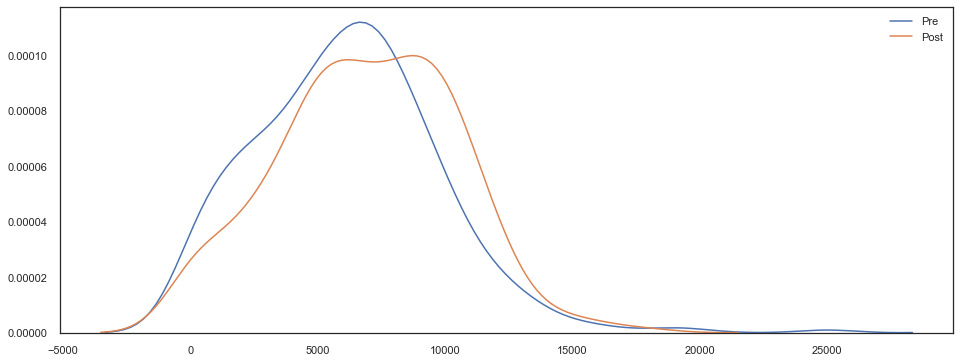

In [160]:
sns.set(rc={'figure.figsize':(16,6)})
sns.set_style(style='white')
plt.figure(figsize=(16, 6))
sns.distplot(pre, hist=False, label='Pre')
sns.distplot(post, hist=False, label='Post')

In [162]:
np.nanmean(pre)

6157.776976975369

In [163]:
np.nanmean(post)

6941.97154794702

In [164]:
np.nanmean(post) / np.nanmean(pre)

1.1273502716814598

In [168]:
from scipy.stats import ttest_ind

In [172]:
ttest_ind(np.array(pre)[~np.isnan(pre)], np.array(post)[~np.isnan(post)], equal_var=False)

Ttest_indResult(statistic=-2.83920132899018, pvalue=0.004664637550585531)

In [174]:
span_more = [i['tot_>=15'] / i['n_months_>=15'] * 12 for i in span]
span_less = [i['tot_<15'] / i['n_months_<15'] * 12 for i in span]

In [177]:
np.nanmean(span_more), np.nanmean(span_less)

(6426.426453246573, 6325.9854516031155)

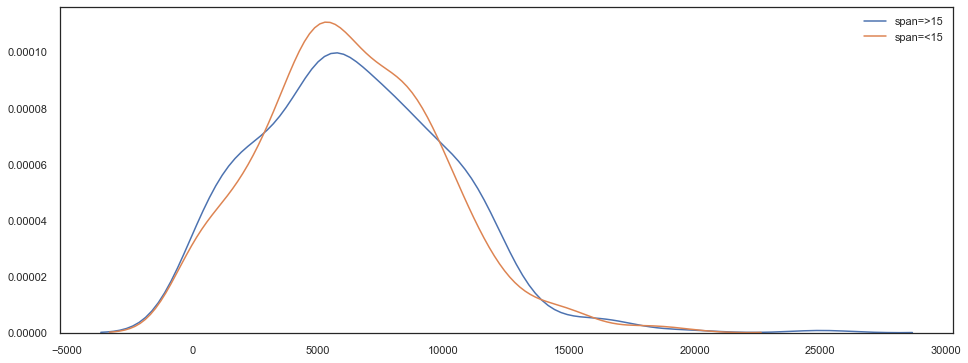

In [175]:
sns.distplot(span_more, hist=False, label='span=>15')
sns.distplot(span_less, hist=False, label='span=<15')

In [176]:
ttest_ind(np.array(span_more)[~np.isnan(span_more)], np.array(span_less)[~np.isnan(span_less)], equal_var=False)

Ttest_indResult(statistic=0.38177031100825726, pvalue=0.7027363990664512)

In [180]:
pre_dis = [(i['<oct18'] - i['disconnect_<oct18']) / i['n_months_<oct18'] * 12 for i in span]
post_dis = [(i['>oct18'] - i['disconnect_>oct18']) / i['n_months_>oct18'] * 12 for i in span]

In [181]:
np.nanmean(pre_dis), np.nanmean(post_dis)

(6005.746393100203, 6813.431900785241)

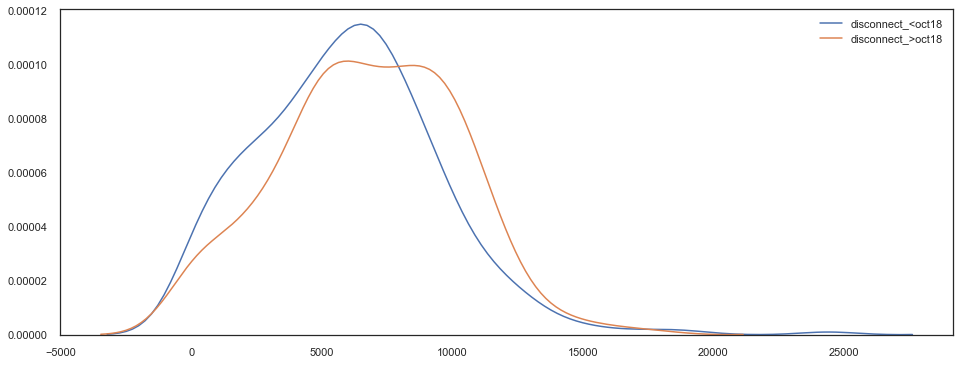

In [183]:
sns.distplot(pre_dis, hist=False, label='disconnect_<oct18')
sns.distplot(post_dis, hist=False, label='disconnect_>oct18')

In [188]:
ttest_ind(np.array(pre_dis)[~np.isnan(pre_dis)], np.array(post_dis)[~np.isnan(post_dis)], equal_var=False)

Ttest_indResult(statistic=-2.9854258988463993, pvalue=0.0029389270534485026)

In [185]:
dis_pre = [i['disconnect_<oct18'] / i['n_months_>=15'] * 12 for i in span]
dis_post = [i['disconnect_>oct18'] / i['n_months_>oct18'] * 12 for i in span]

In [186]:
np.nanmean(dis_pre), np.nanmean(dis_post)

(152.0305838751643, 128.53964716177862)

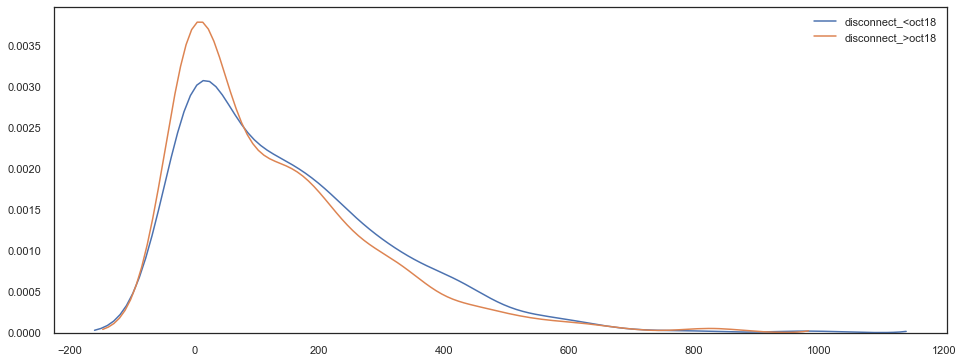

In [187]:
sns.distplot(dis_pre, hist=False, label='disconnect_<oct18')
sns.distplot(dis_post, hist=False, label='disconnect_>oct18')

In [189]:
ttest_ind(np.array(dis_pre)[~np.isnan(dis_pre)], np.array(dis_post)[~np.isnan(dis_post)], equal_var=False)

Ttest_indResult(statistic=1.885097598064222, pvalue=0.05986422766559009)

In [190]:
dis_more = [i['disconnect_>=15'] / i['n_months_>=15'] * 12 for i in span]
dis_less = [i['disconnect_<15'] / i['n_months_<15'] * 12 for i in span]

In [191]:
np.nanmean(dis_more), np.nanmean(dis_less)

(144.8113882348186, 143.84269063297432)

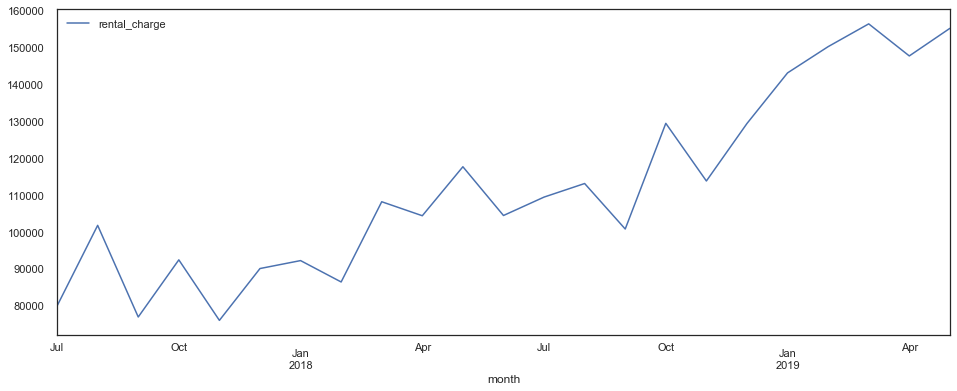

In [166]:
df.groupby('month').agg({'rental_charge': 'sum'}).plot()

In [234]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [231]:
reg = xgb.XGBRegressor(
    learning_rate=.1,
    n_estimators=1000,
    verbosity=1,
    n_jobs=6,
    max_depth=5,
    colsample_bytree=.7
)

In [146]:
pred_cols = [
    'SalesSystemCode', 'Month', 
    'Gender', 'Length_of_Service', 'Age', 
    'Span_of_control__supervisor', 'Length_of_Service__supervisor',
    'Dominance', 'Extraversion', 'Patience',
    'Formality', 'Personality_type', 'Rental_Charge'
]

In [211]:
x = df.groupby(['SalesSystemCode', 'Month']).agg({
    'Rental_Charge': 'sum',
    'Span_of_control__supervisor': lambda x: 1 if np.mean(x) > 15 else 0
}).join(df[pred_cols].set_index(['SalesSystemCode', 'Month'])
        .drop(['Rental_Charge', 'Span_of_control__supervisor'], axis=1), how='left').drop_duplicates()

In [212]:
x.head()

Rental_Charge  Span_of_control__supervisor Gender  \
SalesSystemCode Month                                                           
2352.0          2017-07-01      1048.7825                          1.0      M   
                2017-08-01      2202.6500                          1.0      M   
                2017-09-01      1404.7050                          1.0      M   
                2017-10-01        97.4250                          1.0      M   
2353.0          2017-07-01       111.1000                          1.0      M   

                            Length_of_Service  Age  \
SalesSystemCode Month                                
2352.0          2017-07-01                196   31   
                2017-08-01                227   31   
                2017-09-01                257   31   
                2017-10-01                261   31   
2353.0          2017-07-01                196   23   

                            Length_of_Service__supervisor Dominance  \
SalesSystemCode Month                                                 
2352.0          2017-07-01                         1925.0       NaN   
                2017-08-01                         1956.0       NaN   
                2017-09-01                         1986.0       NaN   
                2017-10-01                         2017.0       NaN   
2353.0          2017-07-01                         1158.0       NaN   

                           Extraversion Patience Formality Personality_type  
SalesSystemCode Month                                                        
2352.0          2017-07-01          NaN      NaN       NaN              NaN  
                2017-08-01          NaN      NaN       NaN              NaN  
                2017-09-01          NaN      NaN       NaN              NaN  
                2017-10-01          NaN      NaN       NaN              NaN  
2353.0          2017-07-01          NaN      NaN       NaN              NaN

In [213]:
x = x.reset_index()
x['Month'] = x.Month.dt.month

In [214]:
gender = LabelEncoder()
x['Gender'] = gender.fit_transform(x.Gender)

In [216]:
x_dum = pd.get_dummies(x[['Month', 'Dominance', 'Extraversion', 'Patience', 'Formality', 'Personality_type']],
                       dummy_na=True)

In [217]:
x_dum = (pd.concat([x[['Gender',
                      'Rental_Charge',
                      'Span_of_control__supervisor',
                      'Length_of_Service',
                      'Age',
                      'Length_of_Service__supervisor',]], 
                    x_dum], axis=1))

In [218]:
y = x_dum.Rental_Charge
x = x_dum.drop('Rental_Charge', axis=1)

In [219]:
x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=.4, random_state=68541
)

x_test, x_eval, y_test, y_eval = train_test_split(
    x_test, y_test, test_size=.5, random_state=68541
)

In [232]:
reg.fit(
    x_train,
    y_train,
    eval_set=[[x_eval, y_eval]],
    early_stopping_rounds=50,
    eval_metric='rmse',
    verbose=1
)

[15:11:02] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:653.492
Will train until validation_0-rmse hasn't improved in 50 rounds.
[1]	validation_0-rmse:605.004
[2]	validation_0-rmse:562.782
[3]	validation_0-rmse:526.22
[4]	validation_0-rmse:494.917
[5]	validation_0-rmse:467.295
[6]	validation_0-rmse:444.11
[7]	validation_0-rmse:422.614
[8]	validation_0-rmse:405.477
[9]	validation_0-rmse:389.741
[10]	validation_0-rmse:377.141
[11]	validation_0-rmse:366.048
[12]	validation_0-rmse:356.922
[13]	validation_0-rmse:349.662
[14]	validation_0-rmse:342.571
[15]	validation_0-rmse:337.572
[16]	validation_0-rmse:332.317
[17]	validation_0-rmse:326.914
[18]	validation_0-rmse:323.057
[19]	validation_0-rmse:319.894
[20]	validation_0-rmse:317.128
[21]	validation_0-rmse:314.809
[22]	validation_0-rmse:312.902
[23]	validation_0-rmse:311.484
[24]	validation_0-rmse:309.515
[25]	val

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=5, min_child_weight=1, missing=None, n_estimators=1000,
             n_jobs=6, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [233]:
reg.score(x_test, y_test)

0.4212793893259198

In [236]:
np.sqrt(mean_squared_error(y_test, reg.predict(x_test)))

300.0258086033224

In [237]:
y_pred = reg.predict(x_test)

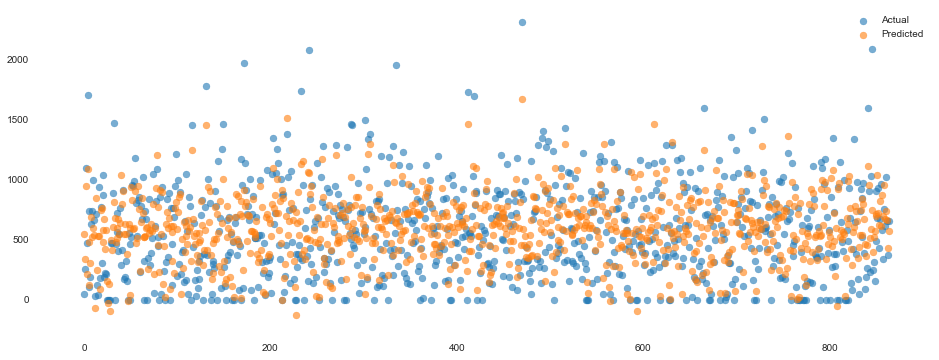

In [242]:
plt.figure(figsize=(16, 6))
plt.scatter(range(0, y_test.shape[0]), y_test, label='Actual', alpha=.6)
plt.scatter(range(0, y_pred.shape[0]), y_pred, label='Predicted', alpha=.6)
plt.legend()
plt.show()

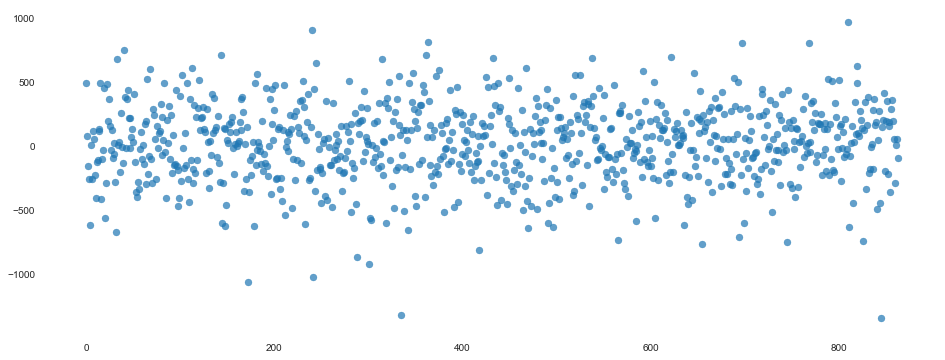

In [245]:
plt.figure(figsize=(16, 6))
plt.scatter(range(0, y_test.shape[0]), y_pred - y_test, alpha=.7)

In [246]:
import shap

shap.initjs()

In [247]:
np.random.randint(0, x_train.shape[0], 2000)

array([2301, 1346, 1105, ..., 1708, 2129, 1002])

In [252]:
explainer = shap.TreeExplainer(reg, x_train, feature_dependence="independent")
shap_values = explainer.shap_values(x_test)

100%|===================| 862/864 [02:10<00:00]        

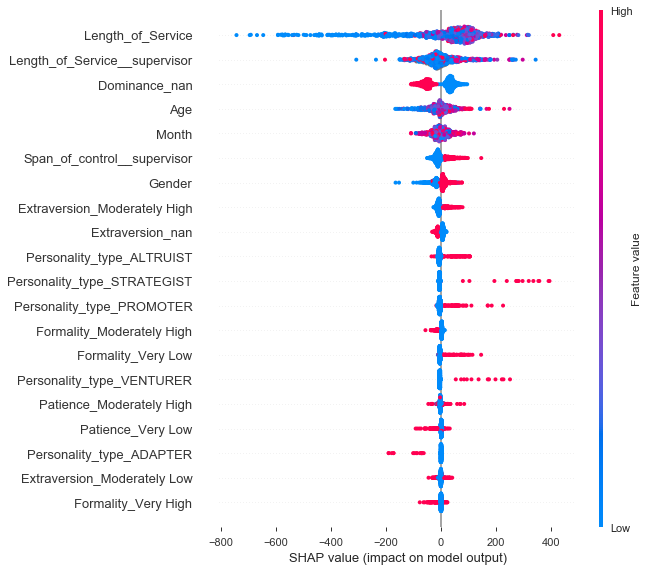

In [253]:
shap.summary_plot(shap_values, x_test, 
                  feature_names=x.columns)

In [265]:
idx = 230
shap.force_plot(explainer.expected_value, shap_values[idx,:], x.iloc[idx,:])